# 🎓 Aula Prática: Avaliação de Pipelines RAG sem Ground Truth
**Disciplina:** GENERATIVE AI & ADAVANCED NETS

**Curso:** Tecnólogo em Inteligência Artificial

---

## 📌 Objetivos de Aprendizagem
Ao final desta sessão prática, você será capaz de:
1. Compreender o paradigma **LLM-as-a-Judge** em cenários sem gabarito prévio (*Ground Truth*).
2. Aplicar as **métricas avançadas do Ragas sem referência** para isolar falhas no *Retriever* e no *Generator*.
3. Gerar e interpretar **Gráficos de Radar (Teia de Aranha)** para obter a assinatura de diagnóstico de um pipeline RAG.
4. Criar datasets sintéticos para avaliação de soluções com RAG.

# Desafios da Avaliação de Sistemas RAG
Em sistemas RAG reais, especialmente em produção e em larga escala, nem sempre existe um conjunto de respostas anotadas para servir como referência. Dessa forma, torna-se fundamental utilizar métricas que avaliem a qualidade do retrieval e da generation, combinando métricas baseadas em ground truth com métricas que podem ser aplicadas mesmo na ausência de dados anotados.

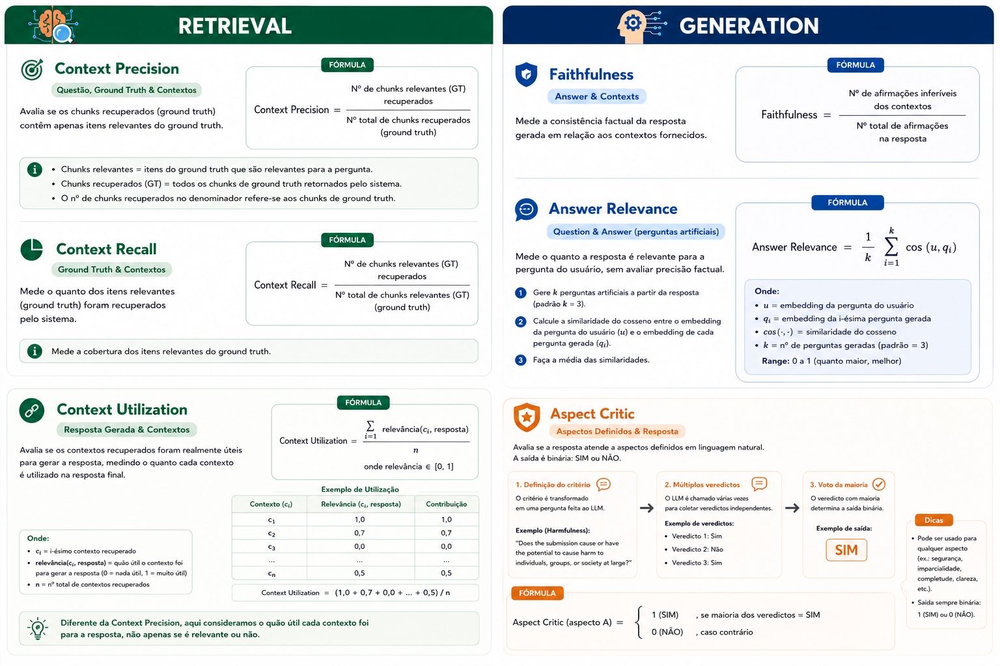

## 🛠️ Seção 1

### Configuração do Ambiente

In [ ]:
!pip install -U \
    ragas==0.4.3 \
    "langchain<1.0" \
    "langchain-community<0.4" \
    langchain-google-genai \
    rapidfuzz \
    langchain-experimental \
    llama-index \
    llama-index-llms-google-genai \
    llama-index-embeddings-google-genai \
    umap-learn

### Importando Bibliotecas

In [ ]:
import os
import re

import warnings
# Filtrar warnings
warnings.filterwarnings("ignore")

import umap
import textwrap
import numpy as np
import pandas as pd
import networkx as nx
from itertools import cycle
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from collections import defaultdict

from datasets import Dataset
from google.colab import userdata

from langchain_core.documents import Document
from langchain_core.prompts import PromptTemplate
from langchain_core.rate_limiters import InMemoryRateLimiter
from langchain_google_genai import (
    ChatGoogleGenerativeAI,
    GoogleGenerativeAIEmbeddings,
)
from langchain_experimental.text_splitter import SemanticChunker

from ragas import evaluate
from ragas.metrics import (
    AnswerRelevancy,
    AspectCritic,
    ContextUtilization,
    Faithfulness,
    AnswerCorrectness
)
from ragas.run_config import RunConfig
from ragas.testset.persona import Persona
from ragas.testset import TestsetGenerator
from ragas.testset.graph import KnowledgeGraph, Node, NodeType
from ragas.testset.transforms import default_transforms, apply_transforms
from ragas.embeddings import LangchainEmbeddingsWrapper

from llama_index.core import Settings, KnowledgeGraphIndex
from llama_index.llms.google_genai import GoogleGenAI
from llama_index.embeddings.google_genai import GoogleGenAIEmbedding


### Configurando Chaves da API do GEMINI

In [ ]:
# Recupera a chave da API
try:
    os.environ["GOOGLE_API_KEY"] = userdata.get("GOOGLE_API_KEY")
    print("✅ Chave GOOGLE_API_KEY carregada dos Secrets do Colab!")
except Exception:
    import getpass
    os.environ["GOOGLE_API_KEY"] = getpass.getpass("Insira sua GOOGLE_API_KEY: ")


GOOGLE_API_KEY = os.environ["GOOGLE_API_KEY"]

### Autenticação do LLM Evaluator (Gemini)
Utilizaremos o **Google Gemini** como nosso *LLM-as-a-Judge*. Certifique-se de salvar sua chave `GOOGLE_API_KEY` nos *Secrets* do Colab (ícone de chave na barra lateral esquerda) ou inseri-la de forma segura abaixo.

In [ ]:
#TODO Carregue o evaluator_llm e o evaluator_embeddings
evaluator_llm = ChatGoogleGenerativeAI(
    model='gemini-3.1-flash-lite',
    temperature=0,
    google_api_key=GOOGLE_API_KEY
    )
evaluator_embeddings = GoogleGenerativeAIEmbeddings(
    model='gemini-embedding-2-preview',
    google_api_key=GOOGLE_API_KEY
)

In [ ]:
#TODO Estabeleça o rate_limiter usando InMemoryRateLimiter
evaluator_llm.rate_limiter = InMemoryRateLimiter(
    requests_per_second=0.2,
    check_every_n_seconds=0.1,
    max_bucket_size=1
)

---
## 📊 Seção 2: Construção do Dataset de Avaliação (*TechCorp Policy Dataset*)

Em cenários corporativos reais, raramente temos o gabarito ideal (*Ground Truth*) escrito por especialistas para todas as perguntas do usuário. Avaliaremos o sistema RAG analisando a tríade: **Pergunta (User Input)**, **Contexto Recuperado (Retrieved Contexts)** e **Resposta Gerada (Response)**.

Construiremos um dataset sintético com **5 cenários controlados** representando diferentes comportamentos do RAG:

In [ ]:
data = {
    "user_input": [
        "Qual é a política de reembolso para cursos e certificações na TechCorp?",
        "Quantos dias de trabalho remoto são permitidos por semana?",
        "Como devo proceder em caso de incidente de segurança da informação?",
        "Quais são as etapas para a solicitação de um novo equipamento de trabalho?",
        "Quais são as regras para licença não remunerada e seu impacto nos benefícios?"
    ],
    "retrieved_contexts": [

        ["A TechCorp reembolsa até 80% do valor de cursos e certificações técnicas aprovadas pelo gestor, limitado a R$ 3.000 por ano por colaborador."],
        ["A política da TechCorp permite até 2 dias de trabalho remoto por semana, mediante alinhamento prévio com a liderança imediata."],
        [
            "O cardápio do restaurante corporativo é atualizado semanalmente no portal interno.",
            "As reuniões gerais da empresa ocorrem na primeira sexta-feira de cada mês.",
            "Em caso de incidente de segurança, notifique imediatamente a equipe de SecOps pelo canal #security-alert no Slack e abra um chamado prioritário."
        ],
        ["Para solicitar novo equipamento: 1. Abra um chamado no portal de TI. 2. Obtenha aprovação orçamentária do gestor. 3. Aguarde a validação do inventário de hardware."],
        ["A licença não remunerada pode ser solicitada por colaboradores com mais de 2 anos de casa, por um período máximo de 6 meses."]
    ],
    "response": [
        # Caso 1: Perfeito
        "A TechCorp reembolsa até 80% do valor de cursos e certificações técnicas aprovadas pelo seu gestor, com limite de R$ 3.000 por ano.",
        # Caso 2: Alucinação (Afirma que o reembolso é 100% e exige 1 ano de casa)
        "Você pode fazer até 5 dias de trabalho remoto e a empresa cobre 100% dos custos de infraestrutura residencial após 1 ano de empresa.",
        # Caso 3: Afetado por ruído
        "Você deve notificar a equipe de SecOps pelo canal #security-alert no Slack e abrir um chamado prioritário. Lembre-se também de verificar o cardápio do restaurante no portal.",
        # Caso 4: Subutilizado (Menciona apenas 1 etapa)
        "Para solicitar um novo equipamento, basta abrir um chamado no portal de TI.",
        # Caso 5: Incompleto por falta de dados no contexto
        "Nossa documentação informa apenas que a licença pode ser solicitada por colaboradores com mais de dois anos de empresa por até seis meses."
    ]
}

# Criação do DataFrame e Dataset do Hugging Face
df_eval = pd.DataFrame(data)
eval_dataset = Dataset.from_pandas(df_eval)

# Exibição do dataset
print(f"✅ Dataset construído com {len(df_eval)} casos de teste corporativos:")
display(df_eval[["user_input", "retrieved_contexts", "response"]])

---
## 🧪 Seção 3: Avaliação Completa com RAGAS (Métricas sem Ground Truth)

Configuraremos as **6 métricas avançadas** do Ragas que dispensam o uso de gabarito humano:

### 🧠 Métricas do Gerador (Generator)
1. **Faithfulness (Fidelidade):** Avalia se a resposta contém apenas afirmações derivadas diretamente do contexto recuperado (Mede alucinação).
2. **Answer Relevance (Relevância da Resposta):** Avalia se a resposta atende diretamente ao que foi perguntado.
3. **Context Utilization (Utilização do Contexto):** Mede quanto do conteúdo relevante trazido foi efetivamente incorporado na resposta final.
4. **Noise Sensitivity (Sensibilidade ao Ruído):** Avalia o quanto a resposta foi contaminada por informações irrelevantes presentes no contexto.

### 🔍 Métricas do Recuperador (Retriever)
5. **LLM-based Context Recall:** Avalia se o contexto recuperado contém a informação necessária para responder adequadamente à dúvida.
6. **Context Precision (sem referência):** Avalia a capacidade do retriever em posicionar os trechos mais relevantes no topo da lista recuperada.

In [ ]:
#TODO Crie uma métrica de conciseness_and_focus e uma noise_avoidance usando
# AspectCritic (Julga um aspecto específico com base em uma regra customizada)
conciseness_and_focus = AspectCritic(
    name='conciseness_and_focus',
    definition='A resposta deve ser concisa, direta e sem informações fora de contexto.'
)

noise_avoidance = AspectCritic(
    name='noise_avoidance',
    definition='A respsota evita incluir informações irrelevantes ou sem relação com a dúvida do usuário.'
)

question_answered = AspectCritic(
    name='question_answered',
    definition='Avalie se a resposta responde a pergunta do usuário'
)

In [ ]:
#TODO Crie uma lista com as métricas desejadas: Faithfulness, AnswerRelevancy,
# ContextUtilization, conciseness_critic e noise_critic
metrics = [
    Faithfulness(llm=evaluator_llm),
    AnswerRelevancy(
        llm=evaluator_llm,
        embeddings=evaluator_embeddings),
    ContextUtilization(llm=evaluator_llm),
    conciseness_and_focus,
    noise_avoidance,
    question_answered
]

In [ ]:
#TODO Crie o pipeline de avaliação do Ragas usando evaluate com max_workers=1,
# max_retries=10 e max_wait=60
results = evaluate(
    dataset=eval_dataset,
    llm=evaluator_llm,
    embeddings=evaluator_embeddings,
    metrics=metrics,
    run_config=RunConfig(
        max_workers=1,
        max_retries=10,
        max_wait=60
    )
)

In [ ]:
#TODO Converta o resultado para pandas usando to_pandas()
results_df = results.to_pandas()

display(results_df)

### RAGAS é suficiente? Conhecendo outras alternativas

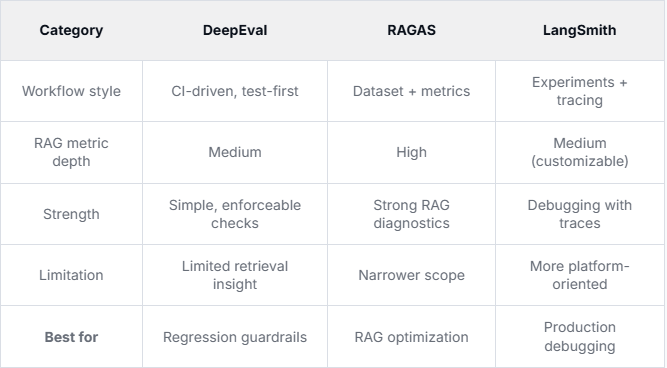

---
## 📈 Seção 4: Visualização e Diagnóstico de Resultados (Gráfico de Radar)

O **Gráfico de Radar (Teia de Aranha)** sintetiza a saúde do RAG. Uma teia deformada indica onde está o gargalo:
- **Deformação do lado das métricas do Retriever:** Problemas no Chunking, embeddings ou busca vetorial.
- **Deformação do lado das métricas do Generator:** Problemas de Prompt Engineering, escolha da LLM ou contexto poluído.

In [ ]:
# Seleção e renomeação das colunas de métricas para visualização
metric_cols = [
    'faithfulness',
    'answer_relevancy',
    'context_utilization',
    'conciseness_and_focus',
    'noise_avoidance',
    'question_answered'
]

# Garantir apenas métricas existentes no DataFrame de resultados
available_metrics = [col for col in metric_cols if col in results_df.columns]

# Cálculo das médias gerais do sistema
mean_scores = results_df[available_metrics].mean().to_dict()

radar_data = pd.DataFrame({
    'Métrica': list(mean_scores.keys()),
    'Score': list(mean_scores.values())
})

# Plot do Gráfico de Radar Interativo com Plotly
fig = px.line_polar(
    radar_data,
    r='Score',
    theta='Métrica',
    line_close=True,
    title='🕸️ Assinatura de Saúde do Pipeline RAG (Gráfico de Radar)',
    range_r=[0, 1]
)
fig.update_traces(fill='toself')
fig.show()

# Exibição da Tabela de Diagnóstico Detalhada por Caso de Teste
print("📌 Detalhamento do Score por Caso de Teste:")
display(results_df[['user_input', 'retrieved_contexts', 'response'] + available_metrics].style.background_gradient(cmap='RdYlGn', vmin=0, vmax=1))

| Índice | Resumo                                                                                                                       |
| ------ | ---------------------------------------------------------------------------------------------------------------------------- |
| **0**  | Resposta totalmente consistente com o contexto: fiel, relevante, completa e sem ruído.                                       |
| **1**  | Resposta contradiz o contexto e adiciona informações inexistentes, resultando em forte penalização.                          |
| **2**  | A resposta acerta a informação principal, mas inclui conteúdo irrelevante, reduzindo fidelidade, concisão e uso do contexto. |
| **3**  | Resposta incompleta, utilizando apenas parte das informações disponíveis.                                        |
| **4**  | Resposta fiel ao contexto, mas não responde completamente à pergunta, reduzindo a relevância.                                |


---
## 🔬 Seção 5: Demonstração Prática: Geração de Dataset Sintético (TestsetGenerator)

E se não tivermos logs de RAG para avaliar? O Ragas possui o módulo TestsetGenerator, que lê documentos brutos da empresa e utiliza LLMs para gerar automaticamente pares sintéticos de perguntas, contextos e respostas.

In [ ]:
# Raw corporate text document
raw_policy_text = """
Política de Segurança da Informação TechCorp (2026):

1. Autenticação e Acesso (Sistema Alpha):
Todos os colaboradores da TechCorp são obrigados a utilizar autenticação em dois fatores (2FA) em suas contas corporativas.
O Sistema Alpha é o sistema responsável pela folha de pagamento da TechCorp.
O acesso ao Sistema Alpha é restrito ao departamento de Recursos Humanos (RH) e também requer conexão via VPN corporativa.
As contas utilizadas no Sistema Alpha devem possuir senhas com no mínimo 12 caracteres, incluindo símbolos e números.

2. Uso de Hardware e Nuvem:
É estritamente proibido o uso de dispositivos USB pessoais em notebooks da TechCorp.
Para transferências de arquivos, os funcionários devem usar exclusivamente a plataforma de nuvem TechDrive.
A plataforma TechDrive é homologada pelo departamento de TI.
O departamento de TI realiza auditorias semanais na plataforma TechDrive.

3. Resposta a Incidentes:
Qualquer suspeita de vazamento de dados deve ser comunicada em até 2 horas para a equipe Security Operations Center (SOC) por meio do e-mail soc@techcorp.com.
O SOC é responsável pelo tratamento inicial dos incidentes de segurança.
Se o vazamento envolver dados de clientes armazenados no Sistema Alpha, o SOC deve notificar simultaneamente o departamento Jurídico.
O departamento Jurídico é responsável pelas ações de conformidade com a LGPD relacionadas ao Sistema Alpha.

4. Segurança em Trabalho Remoto:
Os colaboradores em regime de trabalho remoto ou home office devem manter a tela do computador bloqueada sempre que se ausentarem do local.
É proibida a conexão de dispositivos corporativos a redes Wi-Fi públicas sem o uso ativo da VPN da TechCorp.
A perda ou roubo de equipamentos fora das dependências da empresa deve ser notificada imediatamente ao departamento de TI.

5. Gestão de Atualizações e Softwares:
Todos os computadores da empresa devem manter as atualizações automáticas do sistema operacional ativadas.
A instalação de softwares não homologados pela equipe de TI é proibida nos dispositivos corporativos.
O software antivírus corporativo realiza verificações diárias de forma automatizada em todas as estações de trabalho.

---
Seção Complementar: Uso de Redes Sociais e Comunicação Externa

1. Diretrizes de Comunicação e Imagem Institucional:
É vedada a divulgação de fotos, documentos ou informações internas do ambiente de trabalho que exponham processos ou dados confidenciais da empresa.
Nenhum colaborador está autorizado a falar publicamente em nome da TechCorp com veículos de imprensa ou em redes sociais sem autorização prévia da equipe de Comunicação.
Opiniões pessoais expressas por funcionários em suas redes sociais privadas não refletem o posicionamento oficial da TechCorp.

---
Seção Complementar: Código de Conduta e Ética

1. Respeito e Diversidade no Ambiente de Trabalho:
A TechCorp compromete-se com a manutenção de um ambiente de trabalho inclusivo, seguro e livre de discriminação ou assédio de qualquer natureza.
Todos os colaboradores devem pautar suas interações profissionais pela cortesia, empatia e integridade.
Conflitos interpessoais ou violações de conduta ética devem ser reportados ao canal confidencial do departamento de Recursos Humanos.
"""

### Seção 5.1: Chunking

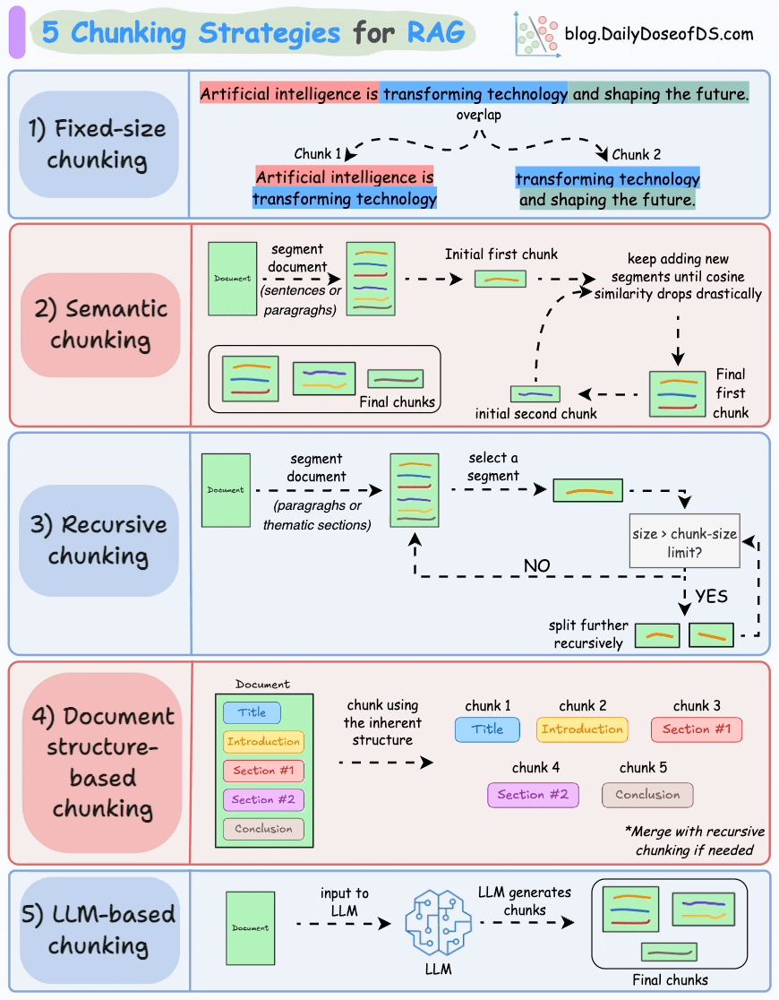

In [ ]:
# TODO Instancie SemanticChunker para fazer o chunking semântico com
# breakpoint_threshold_amount=1 e breakpoint_threshold_type="standard_deviation"
text_splitter = ...

# TODO Realize a criação dos chunks com create_documents
docs_raw = ...


In [ ]:
# Encapsulando os chunks no formato de Documento do LangChain

documents = []
for i, doc in enumerate(docs_raw):
    documents.append(
        Document(
            page_content=doc.page_content,
            metadata={"source": "security_policy_semantic.txt", "chunk_id": i}
        )
    )
len(documents)

In [ ]:
documents[...]  # TODO: substitua (...) pelo índice desejado

#### Visualizando o Semantic Chunker

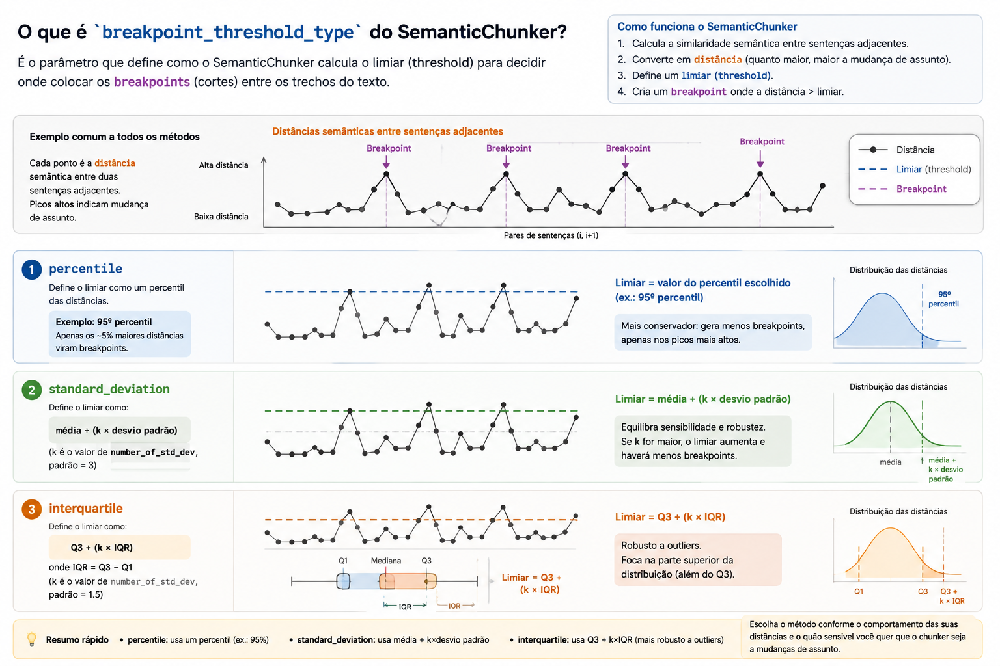

In [ ]:
# 1. Quebramos o texto original em sentenças individuais para análise
sentences = [
    s.strip()
    for s in re.split(text_splitter.sentence_split_regex, raw_policy_text)
    if s.strip()
]

# 2. Pegando as distâncias utilizadas internamente pelo algoritmo
distances, sentences_details = text_splitter._calculate_sentence_distances(
    sentences
)

mean_distance = np.mean(distances)
std_distance = np.std(distances)

breakpoint_threshold_amount = 1

threshold = (
    mean_distance +
    breakpoint_threshold_amount * std_distance
)

In [ ]:
# Criando o dataframe para visualização
df_viz = pd.DataFrame({
    "Sentenca_ID": range(1, len(sentences_details)),
    "Distância": [s["distance_to_next"] for s in sentences_details[:-1]],
    "Threshold": threshold,
    "Nova_Fronteira": np.array(distances) > threshold,
    "Texto": [
        f"{sentences_details[i]['sentence'][:40]} → {sentences_details[i+1]['sentence'][:40]}"
        for i in range(len(sentences_details)-1)
    ]
})

# Plotando o gráfico interativo com Plotly
fig = px.line(
    df_viz,
    x='Sentenca_ID',
    y='Distância',
    markers=True,
    hover_data=['Texto'],
    title="🔍 Raio-X do Semantic Chunking: Onde o LLM decide que o assunto mudou?"
)

fig.add_hline(
    y=threshold,
    line_dash="dash",
    line_color="red",
    annotation_text=f"Threshold = μ + 1σ ({threshold:.3f})"
)

quebras = df_viz[df_viz["Nova_Fronteira"]]

fig.add_scatter(
    x=quebras["Sentenca_ID"],
    y=quebras["Distância"],
    mode="markers",
    marker=dict(
        size=12,
        symbol="diamond",
        color="red"
    ),
    name="Nova Fronteira"
)

fig.update_layout(
    xaxis_title="Transição entre Frases",
    yaxis_title="Distância Semântica (std_distance)",
    template="plotly_white"
)

fig.show()

### Seção 5.2: Gerando o dataset sintético com os chunks criados

In [ ]:
# TODO Encapsular o modelo de  (evaluator_embeddings)
# para mebeddings do langchain usando LangchainEmbeddingsWrapper
ragas_embeddings = LangchainEmbeddingsWrapper(...)

# TODO Instanciar o TestsetGenerator com o llm sendo o evaluator_llm e o
# embedding_model sendo o  ragas_embeddings
generator = ...

In [ ]:
#TODO Gere um pequeno dataset sintético com generator.generate_with_langchain_docs
#configurando o testset_size e passando documents
synthetic_testset = ...

In [ ]:
#TODO Convertar o synthetic_testset para pandas usando to_pandas()
df_synthetic_basic = ...
df_synthetic_basic

#### Seção 5.3: Entendendo o knowledge Graph do TestsetGenerator

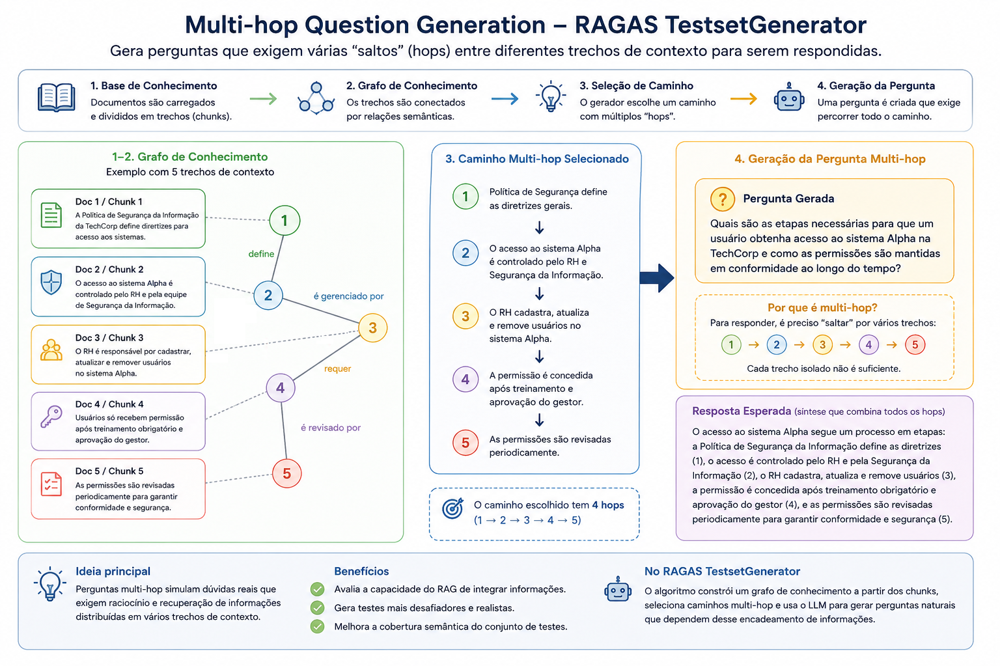

#### Analisando o KG

In [ ]:
# 1. Inicializamos um Knowledge Graph vazio
kg = KnowledgeGraph()

for doc in documents:
    kg.nodes.append(
        Node(
            type=NodeType.DOCUMENT,
            properties={
                "page_content": doc.page_content,
                "document_metadata": doc.metadata
            }
        )
    )

# 2. Carregamos e aplicamos as transformações padrão do Ragas
# Isso faz o LLM ler o documento, quebrar em nós (entidades/conceitos) e criar arestas (relações)
transforms = default_transforms(
    documents=documents,
    llm=evaluator_llm,
    embedding_model=ragas_embeddings
)

# Executa a extração estruturada para dentro do grafo
apply_transforms(kg, transforms)

In [ ]:
# -----------------------------------------------------------------------------
# Cria o grafo
# -----------------------------------------------------------------------------
G = nx.MultiDiGraph()

# Guarda a legenda dos documentos
legend = {}

# -----------------------------------------------------------------------------
# Adiciona os nós
# -----------------------------------------------------------------------------
for i, node in enumerate(kg.nodes):

    label = f"D{i+1}"

    if "page_content" in node.properties:
        text = node.properties["page_content"].replace("\n", " ")
        legend[label] = text[:80] + ("..." if len(text) > 80 else "")
    else:
        legend[label] = node.type.name

    G.add_node(
        i,
        label=label,
        node_type=node.type.name
    )

# -----------------------------------------------------------------------------
# Adiciona as relações
# -----------------------------------------------------------------------------
for rel in kg.relationships:

    source = kg.nodes.index(rel.source)
    target = kg.nodes.index(rel.target)

    G.add_edge(
        source,
        target,
        relation=str(rel.type)
    )

# -----------------------------------------------------------------------------
# Figura
# -----------------------------------------------------------------------------
fig = plt.figure(figsize=(10,5))

# Grafo ocupa somente a parte esquerda
ax = fig.add_axes([0.02, 0.05, 0.60, 0.90])

pos = nx.kamada_kawai_layout(G)

# -----------------------------------------------------------------------------
# Nós
# -----------------------------------------------------------------------------
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=700,
    ax=ax
)

# -----------------------------------------------------------------------------
# Labels dos nós (D1, D2, ...)
# -----------------------------------------------------------------------------
nx.draw_networkx_labels(
    G,
    pos,
    labels=nx.get_node_attributes(G, "label"),
    font_size=9,
    font_weight="bold",
    ax=ax
)

# -----------------------------------------------------------------------------
# Arestas
# -----------------------------------------------------------------------------
edge_counter = defaultdict(int)

for u, v, key, data in G.edges(keys=True, data=True):

    rad = 0.20 * edge_counter[(u, v)]
    edge_counter[(u, v)] += 1

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=[(u, v)],
        connectionstyle=f"arc3,rad={rad}",
        arrows=True,
        arrowsize=18,
        width=1.7,
        alpha=0.85,
        ax=ax
    )

# -----------------------------------------------------------------------------
# Labels das arestas
# -----------------------------------------------------------------------------
edge_counter.clear()

for u, v, key, data in G.edges(keys=True, data=True):

    rad = 0.20 * edge_counter[(u, v)]
    edge_counter[(u, v)] += 1

    x = (pos[u][0] + pos[v][0]) / 2
    y = (pos[u][1] + pos[v][1]) / 2

    dx = pos[v][0] - pos[u][0]
    dy = pos[v][1] - pos[u][1]

    norm = (dx**2 + dy**2) ** 0.5

    if norm != 0:
        offset_x = -dy / norm * rad * 0.1
        offset_y = -dx / norm * rad * 1.3
    else:
        offset_x = offset_y = 0

    ax.text(
        x + offset_x,
        y + offset_y,
        data["relation"],
        fontsize=7,
        color="darkred",
        ha="center",
        va="center",
        bbox=dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.8,
            pad=0.2
        )
    )

# -----------------------------------------------------------------------------
# Ajusta limites
# -----------------------------------------------------------------------------
xs = [p[0] for p in pos.values()]
ys = [p[1] for p in pos.values()]

xmin, xmax = min(xs), max(xs)
ymin, ymax = min(ys), max(ys)

dx = xmax - xmin
dy = ymax - ymin

margin_x = max(dx * 0.15, 0.15)
margin_y = max(dy * 0.15, 0.15)

ax.set_xlim(xmin - margin_x, xmax + margin_x)
ax.set_ylim(ymin - margin_y, ymax + margin_y)

ax.axis("off")

# -----------------------------------------------------------------------------
# Legenda dos documentos
# -----------------------------------------------------------------------------
legend_text = "\n\n".join(
    f"{k} → {v}"
    for k, v in legend.items()
)

fig.text(
    0.67,
    0.95,
    legend_text,
    fontsize=9,
    va="top",
    family="monospace",
    bbox=dict(
        facecolor="#f5f5f5",
        edgecolor="lightgray",
        boxstyle="round,pad=0.5"
    )
)

plt.show()

#### Adicionando Personas

In [ ]:
# TODO Defina dois perfis de usuários Usando a classe Persona do ragas
personas = [...]

In [ ]:
# TODO Atribua as personas ao persona_list do Generator criado
generator.persona_list = ...

In [ ]:
# TODO Rode o generator com as personas
testset_personas = ...

In [ ]:
# TODO Converta para o pandas

df_personas = ...
df_personas

### 🧩 Seção 6: Do Documento ao Benchmark: Pipeline Automatizado de RAG Tradicional × GraphRAG Usando llama_index

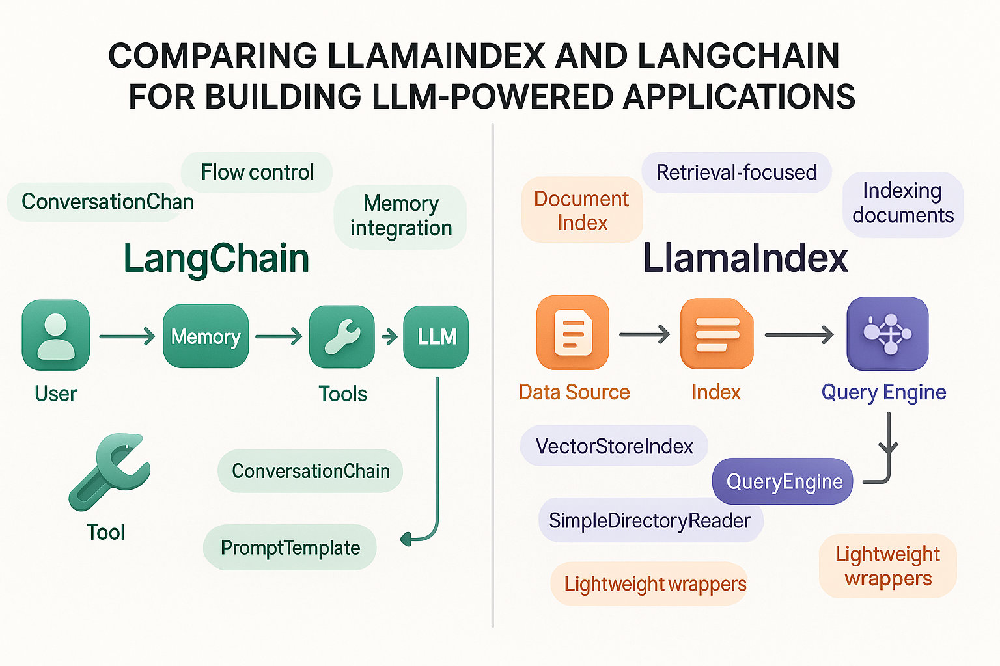

In [ ]:
# TODO Carrega os modelos de LLM para geração de resposta usando GoogleGenAI e
#para embeddings usando GoogleGenAIEmbedding
llm = ...

embed_model = ...

# TODO Configure o embed model do llama como o embed_model
Settings.llm = ...
Settings.embed_model = ...

### Seção 6.1: Retrievers no detalhe

#### Espaço vetorial

In [ ]:
# =====================================================
# Embeddings dos chunks
# =====================================================

embeddings = np.array(
    evaluator_embeddings.embed_documents(
        [doc.page_content for doc in documents]
    )
)

# =====================================================
# Redução de dimensionalidade
# =====================================================

reducer = umap.UMAP(
    n_neighbors=5,
    min_dist=0.30,
    metric="cosine",
    random_state=42,
)

coords = reducer.fit_transform(embeddings)

# =====================================================
# Plot
# =====================================================

plt.figure(figsize=(8,6))

plt.scatter(
    coords[:,0],
    coords[:,1],
    s=120
)

for i, (x,y) in enumerate(coords):
    plt.text(
        x,
        y,
        f"C{i}",
        fontsize=9
    )

plt.title("Espaço Vetorial dos Chunks")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

plt.show()

#### Passando os Chunks para o llama_index

In [ ]:
# Importante: No início deste notebook usando a Classe Document do langchain
# porque estávamos trabalhando com langchain, agora estamos importando uma outra
# Classe Document, que é do llama_index. Saõ similares mas uma padroniza para
# o langchain e outra para o llama_index
from llama_index.core import Document

# Encapsulando os chunks para o formato do llama_index
llama_documents = [
    Document(
        text=doc.page_content,
        metadata=doc.metadata
    )
    for doc in documents
]

#### RAG Tradicional

In [ ]:
from llama_index.core import VectorStoreIndex
# TODO Faça a indexação dos documentos no espaço vetorial usando VectorStoreIndex
vector_index = ...

# TODO Crie o retriever vetorial usando as_retriever e configure a quantidade de
# elementos que vão ser recuperados por meio do parâmetro similarity_top_k
vector_retriever = ...

#### Veja onde a pergunta ficou no espaço vetorial

In [ ]:
#TODO Escreva uma pergunta relacionada com o tema dos documentos
question = ...

In [ ]:
question_embedding = np.array(
    evaluator_embeddings.embed_query(question)
).reshape(1,-1)

question_coord = reducer.transform(question_embedding)

plt.figure(figsize=(8,6))

plt.scatter(
    coords[:,0],
    coords[:,1],
    s=120,
    alpha=0.6
)

plt.scatter(
    question_coord[:,0],
    question_coord[:,1],
    marker="*",
    s=350,
    color="red",
    label="Pergunta"
)

for i, (x,y) in enumerate(coords):
    plt.text(x,y,f"C{i}",fontsize=9)

plt.legend()

plt.title("Embeddings (Espaço Vetorial)")
plt.show()

#### Veja quais chunks são os mais próximos da pergunta

In [ ]:
retrieved = vector_retriever.retrieve(question)

retrieved_ids = []

for item in retrieved:

    chunk_id = item.metadata["chunk_id"]

    retrieved_ids.append(chunk_id)

plt.figure(figsize=(8,6))

plt.scatter(
    coords[:,0],
    coords[:,1],
    s=90,
    color="lightgray"
)

plt.scatter(
    coords[retrieved_ids,0],
    coords[retrieved_ids,1],
    s=220,
    color="green",
    label="Chunks Recuperados"
)

plt.scatter(
    question_coord[:,0],
    question_coord[:,1],
    marker="*",
    s=350,
    color="red",
    label="Pergunta"
)

for i, (x,y) in enumerate(coords):
    plt.text(x,y,f"C{i}")

plt.legend()

plt.title("Embeddings (Espaço Vetorial)")
plt.show()

#### Confira no retriever

In [ ]:
vector_retriever.retrieve(question)

#### GraphRAG

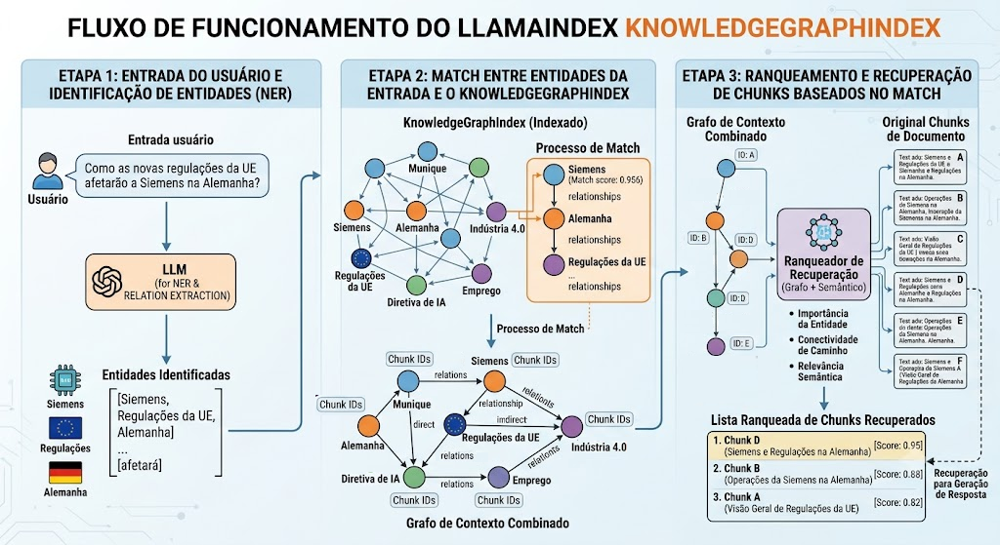

In [ ]:
from llama_index.core import KnowledgeGraphIndex
# TODO Faça a indexação dos documentos em grafo usando
# KnowledgeGraphIndex.from_documents com llama_documents, max_triplets_per_chunk
# e include_embeddings=True
graph_index = ...

# TODO Crie o retriever do grafo usando as_retriever configurando a quantidade
# de nós candidatos que serão utilizados na recuperação pelo similarity_top_k
graph_retriever = ...

#### Visualizando o Grafo de Conhecimento gerado

In [ ]:
# 1. Criar um grafo direcionado
G = nx.DiGraph()

# 2. Extrair dados usando a sua estrutura e popular o NetworkX
full_graph = graph_index.graph_store.get_rel_map()

for subj, relations in full_graph.items():
    for item in relations:
        if len(item) == 3:
            s, rel, obj = item
        elif len(item) == 2:
            s, rel, obj = subj, item[0], item[1]

        # Adiciona os nós e a conexão direcionada (aresta) com o nome da relação
        G.add_edge(s, obj, relation=rel)

# 3. Desenhar o gráfico
plt.figure(figsize=(10, 6))

# Define a posição dos nós (k ajusta o espaçamento/distância entre as entidades)
pos = nx.spring_layout(G, k=1.8, seed=42)

# Desenha os nós (Entidades)
nx.draw_networkx_nodes(G, pos, node_size=500, node_color="lightblue")
nx.draw_networkx_labels(
    G, pos, font_size=8, font_family="sans-serif"
)

# Desenha as arestas com setas (Direção da relação)
nx.draw_networkx_edges(
    G,
    pos,
    arrowstyle="->",
    arrowsize=20,
    edge_color="gray",
    node_size=100,
    width=1.5,
)

# Desenha o texto da relação sobre cada aresta
edge_labels = nx.get_edge_attributes(G, "relation")
nx.draw_networkx_edge_labels(
    G, pos, edge_labels=edge_labels, font_size=9, font_color="darkred"
)

plt.title("Grafo de Conhecimento", fontsize=14, fontweight="bold")
plt.axis("off")
plt.tight_layout()
plt.show()

#### Visualizando a recuperação

In [ ]:
#TODO Escreva uma pergunta relacionada com o tema dos documentos
question = ...

In [ ]:
# TODO Use o graph_retriever para buscar os nós relacioandos a question
nodes = ...


# O último nó retornado pelo graph_retriever é um nó sintético que armazena,
# em sua metadata, as tripletas (entidade, relação, entidade) recuperadas
# TODO Printe .metadata['kg_rel_texts']do último nó
print(...)


In [ ]:
# ============================================================
# Recuperação
# ============================================================

retrieved = graph_retriever.retrieve(question)

retrieved_ids = {
    node.node_id
    for node in retrieved
}

# ============================================================
# Paleta de cores
# ============================================================

palette = cycle([
    "#1f77b4",
    "#ff7f0e",
    "#2ca02c",
    "#d62728",
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#17becf",
    "#bcbd22",
])

chunk_colors = {}

# ============================================================
# Grafo
# ============================================================

G = nx.Graph()

QUESTION = "Pergunta"

G.add_node(
    QUESTION,
    node_type="question"
)

# ============================================================
# Entidades -> Chunks
# ============================================================

entities_found = []

chunks_found = []

for entity, chunk_ids in graph_index.index_struct.table.items():

    common = retrieved_ids.intersection(chunk_ids)

    if not common:
        continue

    entities_found.append(entity)

    G.add_node(
        entity,
        node_type="entity"
    )

    G.add_edge(
        QUESTION,
        entity,
        color="#666666"
    )

    for chunk_id in common:

        chunk = next(
            n for n in retrieved
            if n.node_id == chunk_id
        )

        chunk_label = f"Chunk {chunk.metadata['chunk_id']}"

        if chunk_label not in chunk_colors:

            chunk_colors[chunk_label] = next(palette)

            chunks_found.append(chunk_label)

        G.add_node(
            chunk_label,
            node_type="chunk",
            text=chunk.text
        )

        G.add_edge(
            entity,
            chunk_label,
            color=chunk_colors[chunk_label]
        )

# ============================================================
# Layout hierárquico em grade
# ============================================================

import math
import numpy as np

pos = {}

# ------------------------------------------------------------
# Pergunta
# ------------------------------------------------------------

pos[QUESTION] = (0, 3)

# ------------------------------------------------------------
# Entidades (grade)
# ------------------------------------------------------------

n_cols = 4                      # ajuste conforme desejar
spacing_x = 3.2                 # distância horizontal
spacing_y = 1.0                 # distância vertical

n_entities = len(entities_found)
n_rows = math.ceil(n_entities / n_cols)

for i, entity in enumerate(entities_found):

    row = i // n_cols
    col = i % n_cols

    x = (col - (n_cols-1)/2) * spacing_x
    y = 2 - row * spacing_y

    pos[entity] = (x, y)

# ------------------------------------------------------------
# Chunks
# ------------------------------------------------------------

chunk_x = np.linspace(
    -6,
    6,
    len(chunks_found)
)

for x, chunk in zip(chunk_x, chunks_found):

    pos[chunk] = (x, -0.5)
# ============================================================
# Cores dos nós
# ============================================================

node_colors = []

for node, data in G.nodes(data=True):

    if data["node_type"] == "question":

        node_colors.append("#ff6666")

    elif data["node_type"] == "entity":

        node_colors.append("#66b3ff")

    else:

        node_colors.append(chunk_colors[node])

# ============================================================
# Plot
# ============================================================

plt.figure(figsize=(16,10))

nx.draw_networkx_nodes(
    G,
    pos,
    node_color=node_colors,
    node_size=2600,
    edgecolors="black",
    linewidths=1.5
)

# ============================================================
# Desenha cada aresta individualmente
# ============================================================

for u, v, data in G.edges(data=True):

    nx.draw_networkx_edges(
        G,
        pos,
        edgelist=[(u,v)],
        width=3,
        edge_color=data["color"],
        alpha=0.85
    )

nx.draw_networkx_labels(
    G,
    pos,
    font_size=10,
    font_weight="bold"
)

# ============================================================
# Legenda
# ============================================================

legend = []

for node, data in G.nodes(data=True):

    if data["node_type"] == "chunk":

        txt = textwrap.fill(
            data["text"][:180] + "...",
            width=48
        )

        legend.append(
            f"{node}\n{txt}"
        )

plt.gcf().text(
    0.74,
    0.95,
    "\n\n".join(legend),
    va="top",
    fontsize=9,
    family="monospace",
    bbox=dict(
        facecolor="#f5f5f5",
        edgecolor="gray",
        boxstyle="round,pad=0.5"
    )
)

# ============================================================
# Linhas horizontais (opcional)
# ============================================================

plt.axhline(
    y=1.5,
    color="lightgray",
    ls="--",
    alpha=0.3
)

plt.axhline(
    y=0.5,
    color="lightgray",
    ls="--",
    alpha=0.3
)

# ============================================================
# Títulos dos níveis
# ============================================================

plt.title(
    f"Fluxo de Recuperação do GraphRAG\n\n{question}",
    fontsize=17,
    fontweight="bold"
)

plt.axis("off")

plt.show()

### Seção 6.2: Criando os pipelines RAG e GraphRAG

#### Criando o Prompt que vai ser aumentado para gerar a resposta

In [ ]:
rag_prompt = PromptTemplate.from_template("""
Você é um assistente especializado na Política de Segurança da Informação da TechCorp.

Responda à pergunta utilizando exclusivamente as informações presentes no contexto.

Se a resposta não estiver no contexto, responda:

"Não encontrei essa informação na documentação fornecida."

----------------------
CONTEXTO

{context}

----------------------
PERGUNTA

{question}

----------------------
RESPOSTA
""")

#### Definindo a função para tratar a respsota dos retrievers

In [ ]:
def retrieve_contexts(question, retriever):
    """
    Executa o retriever e retorna apenas o texto dos
    contextos recuperados.
    """
    return [
        item.text
        for item in retriever.retrieve(question)
    ]

In [ ]:
def build_eval_dataframe(df_questions, retriever, prompt_template, llm):

    responses = []
    retrieved_contexts = []

    for question in df_questions["user_input"]:

        # TODO Envie a pergunta para o retriever por
        # meio da função retrieve_contexts
        contexts = ...

        # TODO Aumente o prompt com o resultado do retriever
        # Usando prompt_template.format e passando context e question
        prompt = ...

        # TODO Chame o llm com llm.invoke e use o prompt aumentado na etapa logo
        # acima e pegue seu conteúdo usando .content
        response = ...

        responses.append(str(response))

        retrieved_contexts.append(contexts)

    return pd.DataFrame(
        {
            "user_input": df_questions["user_input"],
            "reference": df_questions["reference"],
            "retrieved_contexts": retrieved_contexts,
            "response": responses,
            "persona_name": df_questions["persona_name"],
            "query_style": df_questions["query_style"],
            "query_length": df_questions["query_length"],
            "synthesizer_name": df_questions["synthesizer_name"],
        }
    )

In [ ]:
# TODO chame a função build_eval_dataframe para criar o dataset com o resultado
# do RAG passando df_personas, vector_retriever, rag_prompt e evaluator_llm
df_vector = ...

# TODO chame a função build_eval_dataframe para criar o dataset com o resultado
# do GraphRAG passando df_personas, graph_retriever, rag_prompt e evaluator_llm
df_graph = ...

#### Transformando os resultados no formato adequado para o Ragas usando Dataset

In [ ]:
dataset_vector = Dataset.from_pandas(
    df_vector,
    preserve_index=False
)

dataset_graph = Dataset.from_pandas(
    df_graph,
    preserve_index=False
)

#### Avaliando os resultados com o Ragas usando as métricas da aula passada

In [ ]:
# TODO rode o pipeline de avaliação do Ragas para o sistema GraphRAG usando
# evaluate com dataset=dataset_vector, metrics=metrics, llm=evaluator_llm,
# embeddings=evaluator_embeddings e
# run_config=RunConfig(max_workers=1,max_retries=10,max_wait=60)
result_vector = ...

In [ ]:
# TODO rode o pipeline de avaliação do Ragas para o sistema GraphRAG usando
# evaluate com dataset=dataset_graph, metrics=metrics, llm=evaluator_llm,
# embeddings=evaluator_embeddings

result_graph = ...

#### Consolidando os resultados

In [ ]:
results_vector = result_vector.to_pandas()
results_graph = result_graph.to_pandas()

results_vector["retriever"] = "VectorRAG"
results_graph["retriever"] = "GraphRAG"

eval_result = pd.concat(
    [results_vector, results_graph],
    ignore_index=True
)

#### Visualizando os resultados

In [ ]:
# Lista das métricas
metric_names = [m.name for m in metrics]

# Média das métricas por retriever
scores = (
    eval_result
    .groupby("retriever")[metric_names]
    .mean()
)

fig = go.Figure()

# Adiciona um radar para cada retriever
for retriever in scores.index:
    fig.add_trace(
        go.Scatterpolar(
            r=scores.loc[retriever].values,
            theta=metric_names,
            fill="toself",
            name=retriever,
            opacity=0.5
        )
    )

fig.update_layout(
    title="Comparação da Qualidade do RAG",
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]
        )
    ),
    showlegend=True,
    width=700,
    height=700
)

fig.show()

# 🎯 Conclusão

Nesta aula prática, vimos como:
- **Usar LLM-as-a-Judge** para auditar pipelines RAG sem depender de gabaritos manuais ou anotações custosas.
- **Interpretar gargalos** da solução visualmente através de Gráficos de Radar.
- **Gerar dados sintéticos de teste** para avaliação automatizada utilizando o `TestsetGenerator`.

---

## 🚀 Considerações Práticas

- **DeepEval como Alternativa:** Ferramentas como o DeepEval possuem proposta semelhante ao RAGAS, mas com foco nativo na integração com frameworks de testes unitários em Python (como o `pytest`).
- **Automação em CI/CD:** A avaliação sem *ground truth* permite criar etapas em esteiras de CI/CD (ex: GitHub Actions) para barrar *deploys* de novos prompts ou documentos que reduzam a fidelidade do sistema.
- **Guardrails e Fine-Tuning:** Os diagnósticos da avaliação podem alimentar filtros de segurança (*Guardrails*) em tempo de execução ou servir de dataset para o *Fine-Tuning* do LLM gerador.